In [1]:
# Import Libraries
import pandas as pd
import numpy as np

# Exploratory Data Analysis
import matplotlib.pyplot as plt
import seaborn as sns

# Feature Engineering
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from feature_engine.outliers import Winsorizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder

# Model Training & Evaluation
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score,silhouette_samples
from yellowbrick.cluster import SilhouetteVisualizer

# Model Saving
import pickle

# Others
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Baca file CSV menjadi DataFrames
df1 = pd.read_csv('olist_orders_dataset.csv')
df2 = pd.read_csv('olist_order_payments_dataset.csv')
df3 = pd.read_csv('olist_order_items_dataset.csv')
df4 = pd.read_csv('olist_customers_dataset.csv')
df5 = pd.read_csv('olist_products_dataset.csv')
df6 = pd.read_csv('olist_sellers_dataset.csv')
df7 = pd.read_csv('olist_order_reviews_dataset.csv')

# Gabungkan DataFrames menggunakan primary key 'id'
merged_df = pd.merge(df1[['order_id', 'customer_id', 'order_purchase_timestamp']], df3[['order_id', 'seller_id', 'product_id', 'price']], on='order_id', how='inner')
merged_df = pd.merge(merged_df, df5[['product_id', 'product_category_name']], on='product_id', how='inner')
merged_df = pd.merge(merged_df, df2[['order_id', 'payment_sequential', 'payment_type', 'payment_installments', 'payment_value']], on='order_id', how='inner')
merged_df = pd.merge(merged_df, df6[['seller_id', 'seller_state']], on='seller_id', how='inner')
merged_df = pd.merge(merged_df, df4[['customer_id', 'customer_state']], on='customer_id', how='inner')
merged_df = pd.merge(merged_df, df7[['order_id', 'review_score']], on='order_id', how='inner')

# Drop Duplicate
df = merged_df.drop_duplicates(subset='order_id')
df = df.reset_index(drop=True)
df


,order_id,customer_id,order_purchase_timestamp,seller_id,product_id,price,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,seller_state,customer_state,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,credit_card,1,18.12,SP,SP,4
1,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,2017-08-15 18:29:31,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,credit_card,3,37.77,SP,SP,4
2,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,2017-08-02 18:24:47,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,credit_card,1,37.77,SP,SP,5
3,bfc39df4f36c3693ff3b63fcbea9e90a,53904ddbea91e1e92b2b3f1d09a7af86,2017-10-23 23:26:46,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,boleto,1,44.09,SP,SC,3
4,8736140c61ea584cb4250074756d8f3b,ab8844663ae049fda8baf15fc928f47f,2017-08-10 13:35:55,3504c0cb71d7fa48d967e0e4c94d59d9,b00a32a0b42fd65efb58a5822009f629,75.90,bebes,1,credit_card,1,83.69,SP,SP,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97911,1ab38815794efa43d269d62b98dae815,a0b67404d84a70ef420a7f99ad6b190a,2018-07-01 10:23:10,babcc0ab201e4c60188427cae51a5b8b,31ec3a565e06de4bdf9d2a511b822b4d,79.00,construcao_ferramentas_iluminacao,1,boleto,1,93.13,SP,SP,5
97912,b159d0ce7cd881052da94fa165617b05,e0c3bc5ce0836b975d6b2a8ce7bb0e3e,2017-03-11 19:51:36,8501d82f68d23148b6d78bb7c4a42037,241a1ffc9cf969b27de6e72301020268,19.70,automotivo,1,credit_card,1,30.66,SC,SC,1
97913,735dce2d574afe8eb87e80a3d6229c48,d531d01affc2c55769f6b9ed410d8d3c,2018-07-24 09:46:27,d263fa444c1504a75cbca5cc465f592a,1d187e8e7a30417fda31e85679d96f0f,399.00,moveis_decoracao,1,debit_card,1,444.07,SP,CE,5
97914,25d2bfa43663a23586afd12f15b542e7,9d8c06734fde9823ace11a4b5929b5a7,2018-05-22 21:13:21,edf3fabebcc20f7463cc9c53da932ea8,6e1c2008dea1929b9b6c27fa01381e90,219.90,moveis_decoracao,1,credit_card,4,244.02,SP,MG,4


---

# Feature Engineering

In [3]:
# Cek info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97916 entries, 0 to 97915
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   order_id                  97916 non-null  object 
 1   customer_id               97916 non-null  object 
 2   order_purchase_timestamp  97916 non-null  object 
 3   seller_id                 97916 non-null  object 
 4   product_id                97916 non-null  object 
 5   price                     97916 non-null  float64
 6   product_category_name     96515 non-null  object 
 7   payment_sequential        97916 non-null  int64  
 8   payment_type              97916 non-null  object 
 9   payment_installments      97916 non-null  int64  
 10  payment_value             97916 non-null  float64
 11  seller_state              97916 non-null  object 
 12  customer_state            97916 non-null  object 
 13  review_score              97916 non-null  int64  
dtypes: flo

In [3]:
# Mengganti Dtype datetime
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])

# Extract day of week, jam dan menit
df['day_of_week'] = df['order_purchase_timestamp'].dt.dayofweek
df['hour'] = df['order_purchase_timestamp'].dt.hour
df['minute'] = df['order_purchase_timestamp'].dt.minute

df

,order_id,customer_id,order_purchase_timestamp,seller_id,product_id,price,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,seller_state,customer_state,review_score,day_of_week,hour,minute
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,credit_card,1,18.12,SP,SP,4,0,10,56
1,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,2017-08-15 18:29:31,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,credit_card,3,37.77,SP,SP,4,1,18,29
2,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,2017-08-02 18:24:47,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,credit_card,1,37.77,SP,SP,5,2,18,24
3,bfc39df4f36c3693ff3b63fcbea9e90a,53904ddbea91e1e92b2b3f1d09a7af86,2017-10-23 23:26:46,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,boleto,1,44.09,SP,SC,3,0,23,26
4,8736140c61ea584cb4250074756d8f3b,ab8844663ae049fda8baf15fc928f47f,2017-08-10 13:35:55,3504c0cb71d7fa48d967e0e4c94d59d9,b00a32a0b42fd65efb58a5822009f629,75.90,bebes,1,credit_card,1,83.69,SP,SP,5,3,13,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97911,1ab38815794efa43d269d62b98dae815,a0b67404d84a70ef420a7f99ad6b190a,2018-07-01 10:23:10,babcc0ab201e4c60188427cae51a5b8b,31ec3a565e06de4bdf9d2a511b822b4d,79.00,construcao_ferramentas_iluminacao,1,boleto,1,93.13,SP,SP,5,6,10,23
97912,b159d0ce7cd881052da94fa165617b05,e0c3bc5ce0836b975d6b2a8ce7bb0e3e,2017-03-11 19:51:36,8501d82f68d23148b6d78bb7c4a42037,241a1ffc9cf969b27de6e72301020268,19.70,automotivo,1,credit_card,1,30.66,SC,SC,1,5,19,51
97913,735dce2d574afe8eb87e80a3d6229c48,d531d01affc2c55769f6b9ed410d8d3c,2018-07-24 09:46:27,d263fa444c1504a75cbca5cc465f592a,1d187e8e7a30417fda31e85679d96f0f,399.00,moveis_decoracao,1,debit_card,1,444.07,SP,CE,5,1,9,46
97914,25d2bfa43663a23586afd12f15b542e7,9d8c06734fde9823ace11a4b5929b5a7,2018-05-22 21:13:21,edf3fabebcc20f7463cc9c53da932ea8,6e1c2008dea1929b9b6c27fa01381e90,219.90,moveis_decoracao,1,credit_card,4,244.02,SP,MG,4,1,21,13


## Copy DF untuk Feature Engineering

In [4]:
# Copy df untuk Feature Engineering
df_fe = df.copy()
df_fe.head()

,order_id,customer_id,order_purchase_timestamp,seller_id,product_id,price,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,seller_state,customer_state,review_score,day_of_week,hour,minute
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,credit_card,1,18.12,SP,SP,4,0,10,56
1,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,2017-08-15 18:29:31,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,credit_card,3,37.77,SP,SP,4,1,18,29
2,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,2017-08-02 18:24:47,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,credit_card,1,37.77,SP,SP,5,2,18,24
3,bfc39df4f36c3693ff3b63fcbea9e90a,53904ddbea91e1e92b2b3f1d09a7af86,2017-10-23 23:26:46,3504c0cb71d7fa48d967e0e4c94d59d9,87285b34884572647811a353c7ac498a,29.99,utilidades_domesticas,1,boleto,1,44.09,SP,SC,3,0,23,26
4,8736140c61ea584cb4250074756d8f3b,ab8844663ae049fda8baf15fc928f47f,2017-08-10 13:35:55,3504c0cb71d7fa48d967e0e4c94d59d9,b00a32a0b42fd65efb58a5822009f629,75.90,bebes,1,credit_card,1,83.69,SP,SP,5,3,13,35


## Drop Column

In [5]:
# Drop Kolom
df_fe = df_fe.drop(['order_id', 'customer_id', 'order_purchase_timestamp', 'seller_id', 'product_id'], axis=1)
df_fe

,price,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,seller_state,customer_state,review_score,day_of_week,hour,minute
0,29.99,utilidades_domesticas,1,credit_card,1,18.12,SP,SP,4,0,10,56
1,29.99,utilidades_domesticas,1,credit_card,3,37.77,SP,SP,4,1,18,29
2,29.99,utilidades_domesticas,1,credit_card,1,37.77,SP,SP,5,2,18,24
3,29.99,utilidades_domesticas,1,boleto,1,44.09,SP,SC,3,0,23,26
4,75.90,bebes,1,credit_card,1,83.69,SP,SP,5,3,13,35
...,...,...,...,...,...,...,...,...,...,...,...,...
97911,79.00,construcao_ferramentas_iluminacao,1,boleto,1,93.13,SP,SP,5,6,10,23
97912,19.70,automotivo,1,credit_card,1,30.66,SC,SC,1,5,19,51
97913,399.00,moveis_decoracao,1,debit_card,1,444.07,SP,CE,5,1,9,46
97914,219.90,moveis_decoracao,1,credit_card,4,244.02,SP,MG,4,1,21,13


## Handling Missing Values

In [6]:
# Mencari missing values 
df_fe.isnull().sum()

price                       0
product_category_name    1401
payment_sequential          0
payment_type                0
payment_installments        0
payment_value               0
seller_state                0
customer_state              0
review_score                0
day_of_week                 0
hour                        0
minute                      0
dtype: int64

In [7]:
# Menghitung persentase missing values
nulls = pd.DataFrame(df_fe.isnull().sum(), columns=["nulls"])
nulls["null percentage"] = nulls["nulls"]/df_fe.shape[0]*100
nulls[nulls["nulls"] > 0]

,nulls,null percentage
product_category_name,1401,1.430818


In [8]:
# Drop missing values
df_fe = df_fe.dropna()

In [9]:
# Mencari missing values 
df_fe.isnull().sum().sum()

0

## Split Numerical dan Categorical Column

In [10]:
# Menampilkan kolom
df_fe.columns

Index(['price', 'product_category_name', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'seller_state',
       'customer_state', 'review_score', 'day_of_week', 'hour', 'minute'],
      dtype='object')

In [11]:
# Cek Jumlah Unique Values
df_fe.nunique()

price                     5783
product_category_name       73
payment_sequential          16
payment_type                 4
payment_installments        24
payment_value            27717
seller_state                23
customer_state              27
review_score                 5
day_of_week                  7
hour                        24
minute                      60
dtype: int64

In [12]:
# Split Categorical dan Numerical Column
cat_cols = ['product_category_name', 'payment_type', 'seller_state', 'customer_state', 
            'payment_installments', 'payment_sequential', 'day_of_week', 'review_score', 
            'hour', 'minute']

num_cols = ['price', 'payment_value']



## Handling Outliers

In [13]:
# Cek Skewness 
print('skewness price:', df_fe['price'].skew())
print('skewness payment_value:', df_fe['payment_value'].skew())

skewness price: 7.4552285833609675
skewness payment_value: 9.191388455614685


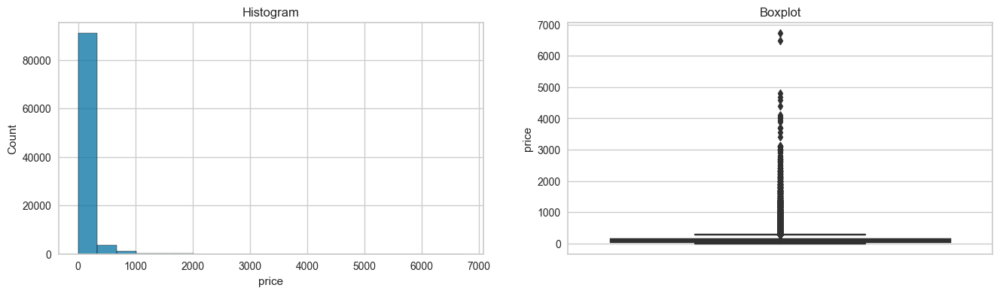

In [15]:
# Membuat Histogram dan Boxplot price
plt.figure(figsize=(16, 4))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df_fe['price'], bins=20)
plt.title('Histogram')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df_fe['price'])
plt.title('Boxplot')

plt.show()

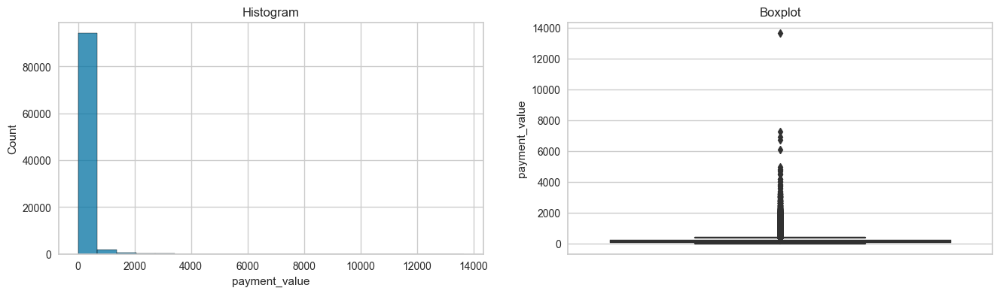

In [16]:
# Membuat Histogram dan Boxplot payment_value
plt.figure(figsize=(16, 4))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df_fe['payment_value'], bins=20)
plt.title('Histogram')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df_fe['payment_value'])
plt.title('Boxplot')

plt.show()

In [17]:
# IQR
q1 = df_fe[num_cols].quantile(0.25)
q3 = df_fe[num_cols].quantile(0.75)
iqr = q3 - q1

# lower dan upper limit
lower_threshold = q1 - 1.5 * iqr
upper_threshold = q3 + 1.5 * iqr

# menghitung persentase outlier
outlier_percentages = ((df_fe[num_cols] < lower_threshold) | (df_fe[num_cols] > upper_threshold)).mean() * 100

print('Outlier Percentage:')
print(outlier_percentages)

Outlier Percentage:
price            7.750091
payment_value    7.800860
dtype: float64


In [14]:
# Create a Winsorizer instance
win = Winsorizer(capping_method='iqr',  
                tail='both', 
                fold=1.5, 
                variables=num_cols)

# Fit and transform on the training data
df_capped = win.fit_transform(df_fe)

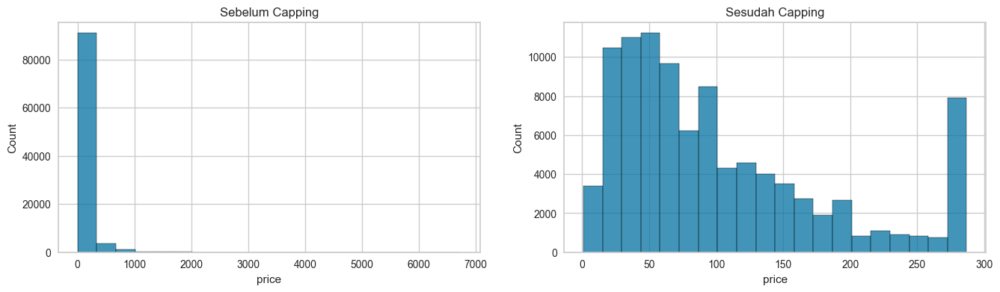

In [19]:
# Perbandingan sebelum dan sesudah capping
plt.figure(figsize=(16, 4))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df_fe['price'], bins=20)
plt.title('Sebelum Capping')

# Histogram
plt.subplot(1, 2, 2)
sns.histplot(df_capped['price'], bins=20)
plt.title('Sesudah Capping')

plt.show()

## Pipeline

In [15]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import category_encoders as ce

In [16]:
# Membuat pipeline untuk skala kolom numerik dengan StandardScaler
num_pipeline = make_pipeline(StandardScaler())

# Membuat pipeline untuk binary encoding kolom kategorikal
cat_pipeline = make_pipeline(ce.BinaryEncoder(cols=cat_cols))

# Menggabungkan pipeline numerik dan kategorikal dengan ColumnTransformer
preprocessing_pipeline = ColumnTransformer([
    ('pipe_num', num_pipeline, num_cols),
    ('pipe_cat', cat_pipeline, cat_cols),
])

In [17]:
# Preprocess data
df_pipe = preprocessing_pipeline.fit_transform(df_capped)


---

# Model Definition

In [18]:
# Define PCA
pca = PCA()
pca.fit(df_pipe)

PCA()

---

# Model Training

Text(0, 0.5, 'Eigenvalues')

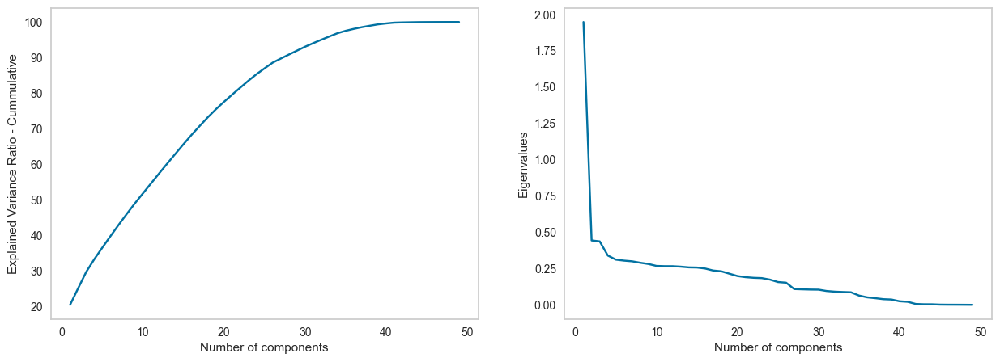

In [19]:
# Plot the Cummulative of Explained Variance Ratio
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(range(1, 50), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained Variance Ratio - Cummulative')

# Plot the Eigenvalues
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(range(1, 50), pca.explained_variance_ )
plt.xlabel('Number of components')
plt.ylabel('Eigenvalues')

In [20]:
# Check the number of features if we want to retain 95 % of the information
cumsum = np.cumsum(pca.explained_variance_ratio_)
num_features = np.argmax(cumsum >= 0.95) + 1
num_features

32

In [21]:
# Define PCA menggunakan 95% fitur
pca = PCA(n_components=0.95)
pca = make_pipeline(preprocessing_pipeline, pca)

# Fit PCA
pca.fit(df_capped)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('pipe_num',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  ['price', 'payment_value']),
                                                 ('pipe_cat',
                                                  Pipeline(steps=[('binaryencoder',
                                                                   BinaryEncoder(cols=['product_category_name',
                                                                                       'payment_type',
                                                                                       'seller_state',
                                                                                       'customer_state',
                                                                                       'payment_installments',
                                                                                       'payment_sequential',
                                                                                       'day_of_week',
                                                                                       'review_score',
                                                                                       'hour',
                                                                                       'minute']))]),
                                                  ['product_category_name',
                                                   'payment_type',
                                                   'seller_state',
                                                   'customer_state',
                                                   'payment_installments',
                                                   'payment_sequential',
                                                   'day_of_week',
                                                   'review_score', 'hour',
                                                   'minute'])])),
                ('pca', PCA(n_components=0.95))])

In [22]:
# Transform PCA
df_pca = pca.transform(df_capped)

---

## Model Evaluation

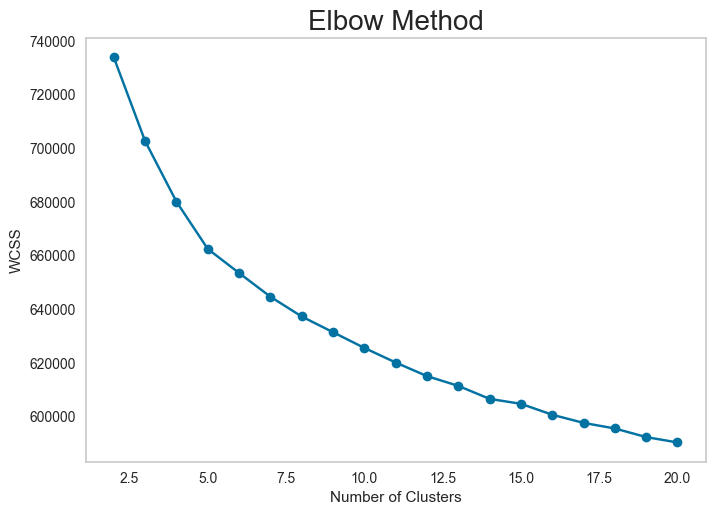

In [23]:
# Mencari jumlah cluster menggunakan elbow method
wcss = []
random_state = 10
max_cluster = 20
for i in range(2, max_cluster+1):
    km = KMeans(n_clusters = i,
                init = 'k-means++',
                max_iter = 300,
                n_init = 10,
                random_state = random_state)
    km.fit(df_pca)
    wcss.append(km.inertia_)

plt.plot(range(2, max_cluster+1), wcss, marker ="o")
plt.grid()
plt.title('Elbow Method', fontsize = 20)
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [29]:
# Function untuk membuat silhouette plot
def plot_silhouette(range_n_clusters, X, random_state):
    for n_clusters in range_n_clusters:
        
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 4)

        # Silhoutte Plot
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        clusterer = KMeans(n_clusters = n_clusters, init = 'k-means++', max_iter = 300, n_init = 10, random_state = random_state)
        cluster_labels = clusterer.fit_predict(X)

        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)
            
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            y_lower = y_upper + 10 

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # Plot persebaran Cluster
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        centers = clusterer.cluster_centers_

        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

For n_clusters = 2 The average silhouette_score is : 0.18180542459439822
For n_clusters = 3 The average silhouette_score is : 0.07582993842854346
For n_clusters = 4 The average silhouette_score is : 0.06198977161775121
For n_clusters = 5 The average silhouette_score is : 0.05908784223391681
For n_clusters = 6 The average silhouette_score is : 0.04861838626672447
For n_clusters = 7 The average silhouette_score is : 0.05097819420904466
For n_clusters = 8 The average silhouette_score is : 0.04738163499288594
For n_clusters = 9 The average silhouette_score is : 0.04326349583758312
For n_clusters = 10 The average silhouette_score is : 0.04437250569881963
For n_clusters = 11 The average silhouette_score is : 0.04347092105737645
For n_clusters = 12 The average silhouette_score is : 0.04152716749486794
For n_clusters = 13 The average silhouette_score is : 0.03879367454945028
For n_clusters = 14 The average silhouette_score is : 0.04065613535974344
For n_clusters = 15 The average silhouette_sco

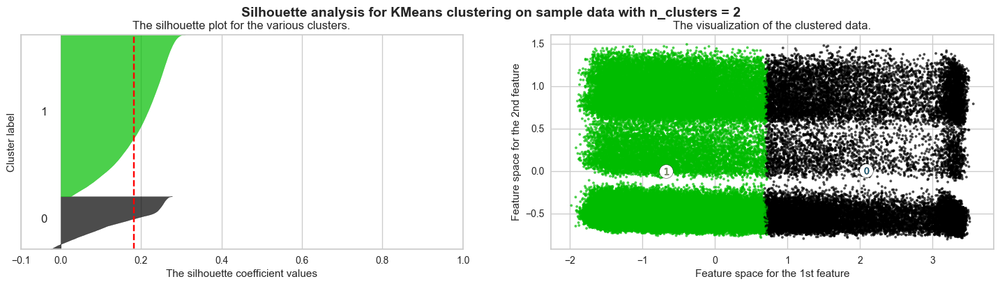

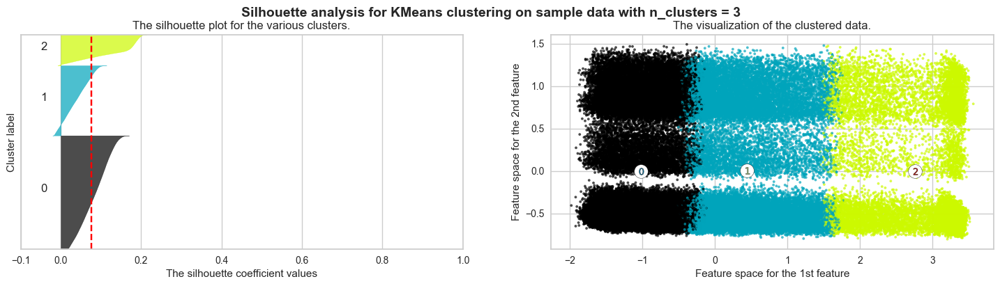

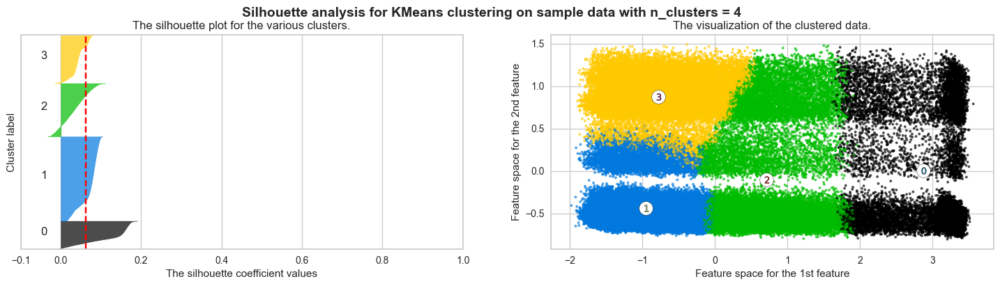

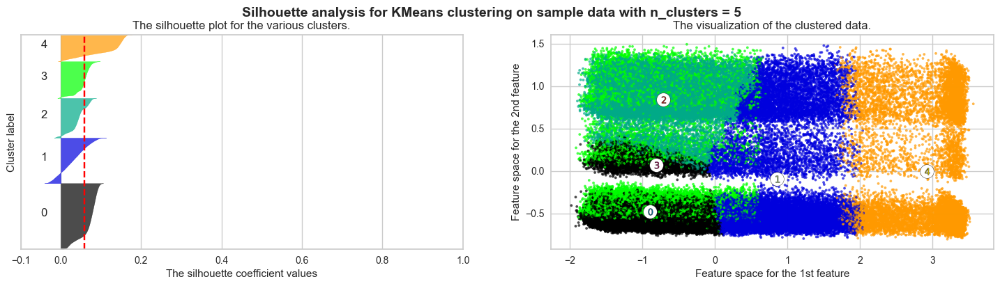

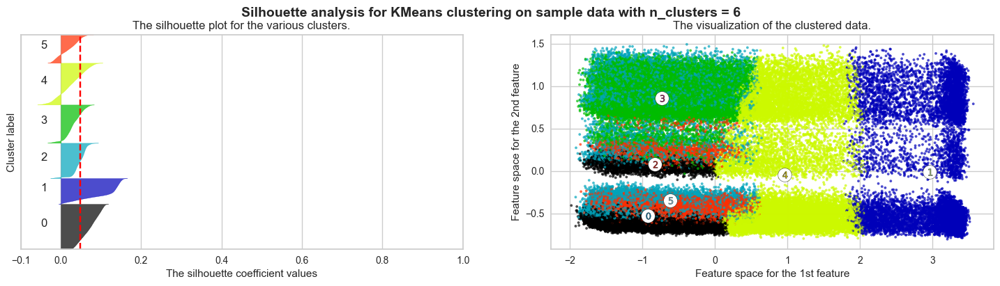

...

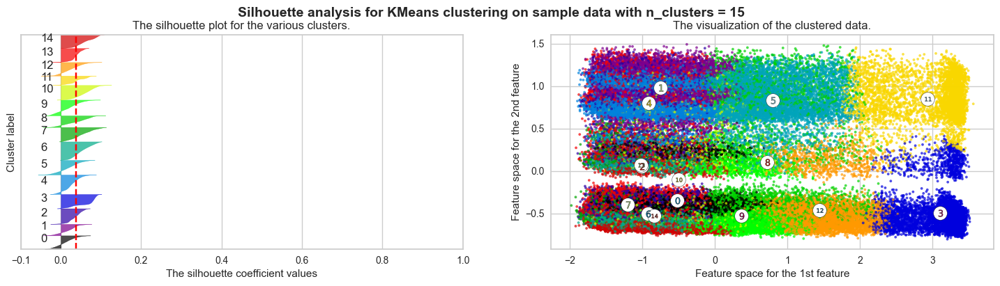

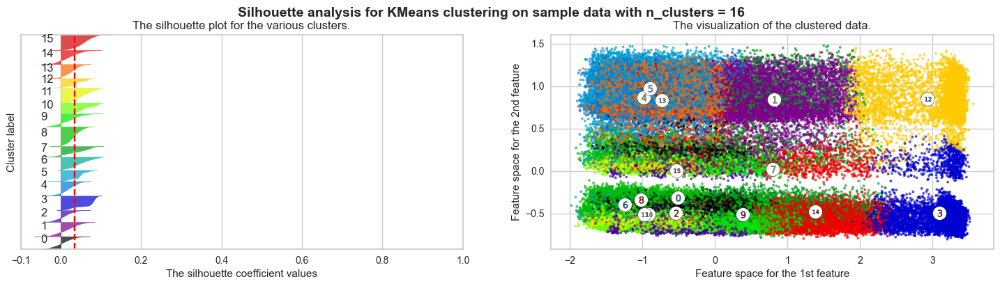

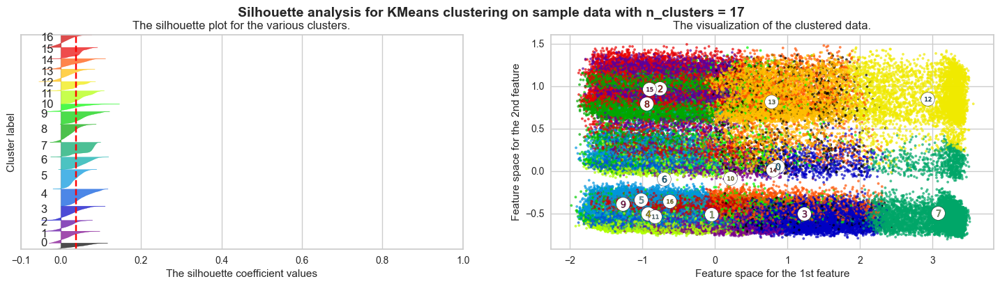

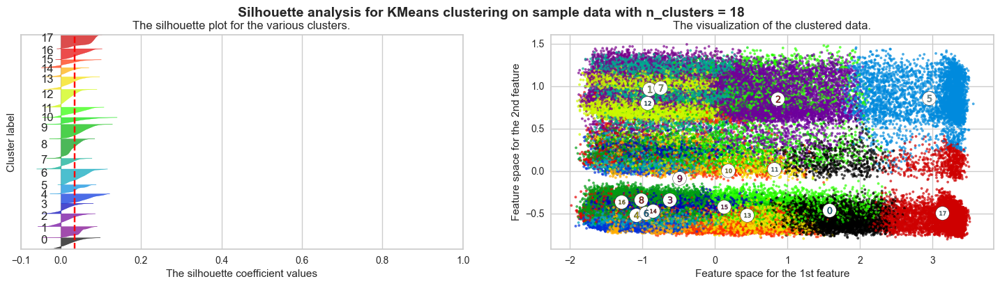

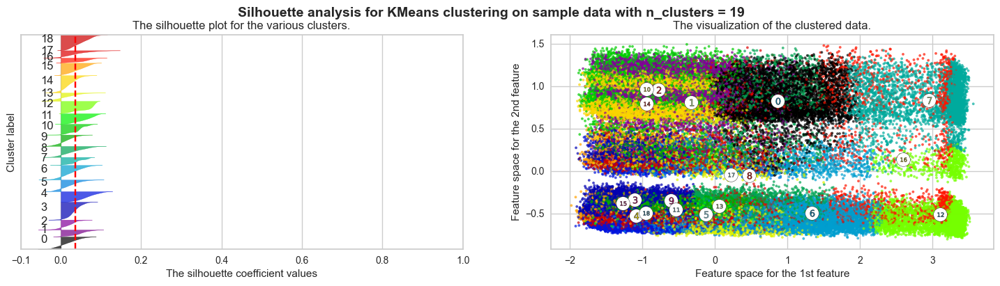

In [30]:
# Menampilkan silhouette plot dan score
plot_silhouette(range(2, max_cluster), df_pca, random_state)

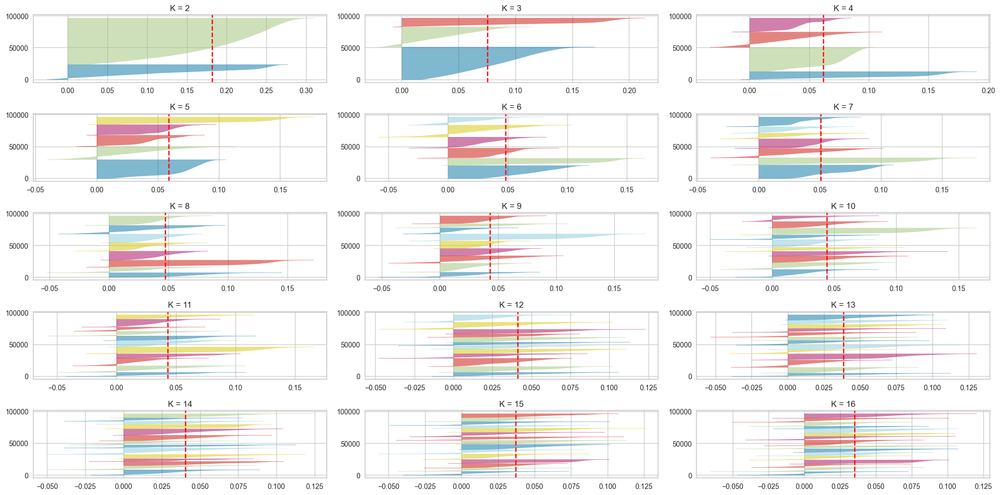

In [32]:
# Dispplay Silhouette Plot
fig, axes = plt.subplots(5, 3, figsize=(15, 10))

for i, ax in enumerate(axes.flatten()):

    n_clusters = i + 2
    kmeans = KMeans(n_clusters = n_clusters, init = 'k-means++', max_iter = 300, n_init = 10, random_state = random_state)

    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax)

    visualizer.fit(df_pca)

    ax.set_title(f'K = {n_clusters}')

plt.tight_layout()
plt.show()

In [24]:
# Train menggunakan hasil cluster yang ditentukan
km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = random_state)
pred = km.fit_predict(df_pca)
pred

array([3, 3, 1, ..., 0, 0, 1])

<Axes: >

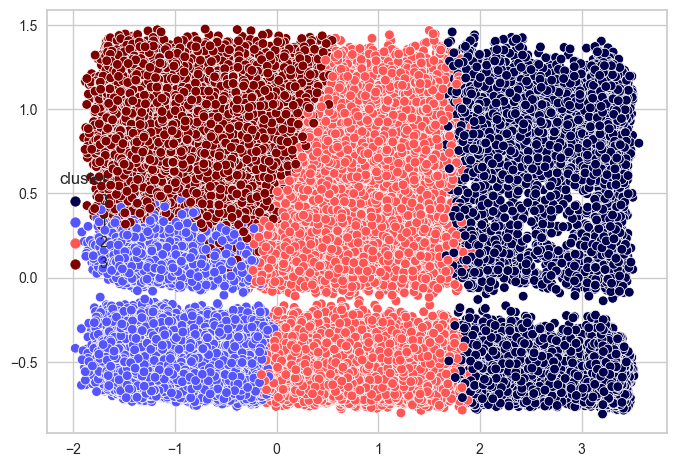

In [35]:
# Cluster visualization dalam 2D
pca_2d = PCA(n_components=2)
pca_2d.fit(df_pca)

df_2d = pca_2d.fit_transform(df_pca)
sns.scatterplot(x=df_2d[:,0], y=df_2d[:,1], hue=df_fe['cluster'], palette='seismic')

In [25]:
# Memasukan hasil clustering pada dataframe
df_fe['cluster'] = pred
df_fe

,price,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,seller_state,customer_state,review_score,day_of_week,hour,minute,cluster
0,29.99,utilidades_domesticas,1,credit_card,1,18.12,SP,SP,4,0,10,56,3
1,29.99,utilidades_domesticas,1,credit_card,3,37.77,SP,SP,4,1,18,29,3
2,29.99,utilidades_domesticas,1,credit_card,1,37.77,SP,SP,5,2,18,24,1
3,29.99,utilidades_domesticas,1,boleto,1,44.09,SP,SC,3,0,23,26,1
4,75.90,bebes,1,credit_card,1,83.69,SP,SP,5,3,13,35,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
97911,79.00,construcao_ferramentas_iluminacao,1,boleto,1,93.13,SP,SP,5,6,10,23,1
97912,19.70,automotivo,1,credit_card,1,30.66,SC,SC,1,5,19,51,3
97913,399.00,moveis_decoracao,1,debit_card,1,444.07,SP,CE,5,1,9,46,0
97914,219.90,moveis_decoracao,1,credit_card,4,244.02,SP,MG,4,1,21,13,0


In [27]:
df_fe.to_csv('df_fe.csv', index=False)

---

# Model Saving

In [36]:
# Saving Model
with open('pipe.pkl', 'wb') as file1:
    pickle.dump(pca, file1)

with open('km.pkl', 'wb') as file2:
    pickle.dump(km, file2)

---

# Model Inference

In [60]:
# Load data yang sudah dibuat di model
with open('pipe.pkl', 'rb') as file1:
    pipe = pickle.load(file1)

with open('km.pkl', 'rb') as file2:
    km = pickle.load(file2)

In [21]:
df['product_category_name'].unique()

array(['utilidades_domesticas', 'bebes', 'cool_stuff', 'esporte_lazer',
       'brinquedos', 'moveis_decoracao', 'perfumaria', 'pet_shop',
       'beleza_saude', 'musica', 'pcs',
       'construcao_ferramentas_construcao', 'sinalizacao_e_seguranca',
       'automotivo', 'relogios_presentes', 'audio', 'eletronicos',
       'informatica_acessorios', 'telefonia', 'consoles_games',
       'papelaria', 'artigos_de_festas', nan, 'fashion_roupa_masculina',
       'fashion_roupa_feminina', 'alimentos',
       'construcao_ferramentas_ferramentas',
       'fashion_bolsas_e_acessorios', 'ferramentas_jardim',
       'moveis_escritorio', 'moveis_sala', 'market_place',
       'cama_mesa_banho', 'casa_conforto', 'artes', 'casa_construcao',
       'climatizacao', 'agro_industria_e_comercio', 'telefonia_fixa',
       'instrumentos_musicais', 'malas_acessorios', 'fashion_esporte',
       'fashion_calcados', 'eletrodomesticos',
       'portateis_casa_forno_e_cafe', 'eletroportateis',
       'construcao_f

In [58]:
# Membuat Data Inference
data_inf = {
    'order_id': 'e481f51cbdc54678b7cc31236f2d6af7', 
    'customer_id': '1ef432eb6251297304e76186b10a928d', 
    'order_purchase_timestamp': '2017-10-02 11:56:33', 
    'seller_id': '3504c0cb71d7fa48d967e0e4c94d59d8',
    'product_id': '87285b34884572647811a353c7ac498b', 
    'price': 19.70, 
    'product_category_name': 'bebes', 
    'payment_sequential': 1,
    'payment_type': 'boleto', 
    'payment_installments': 1, 
    'payment_value': 44.09, 
    'seller_state': 'SP',
    'customer_state': 'SC', 
    'review_score': 5, 
    'day_of_week': 2, 
    'hour': 10, 
    'minute': 17
}

In [59]:
# Convert to dataframe
data_inf = pd.DataFrame([data_inf])
data_inf

,order_id,customer_id,order_purchase_timestamp,seller_id,product_id,price,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,seller_state,customer_state,review_score,day_of_week,hour,minute
0,e481f51cbdc54678b7cc31236f2d6af7,1ef432eb6251297304e76186b10a928d,2017-10-02 11:56:33,3504c0cb71d7fa48d967e0e4c94d59d8,87285b34884572647811a353c7ac498b,19.7,bebes,1,boleto,1,44.09,SP,SC,5,2,10,17


In [61]:
# Make a prediction
pca = pipe.transform(data_inf)
pred = km.predict(pca)
print('cluster:',pred[0])

cluster: 1


---

# EDA

In [28]:
# Membuat df baru dengan cluster
df_cluster = df_fe.copy()
df_cluster

,price,product_category_name,payment_sequential,payment_type,payment_installments,payment_value,seller_state,customer_state,review_score,day_of_week,hour,minute,cluster
0,29.99,utilidades_domesticas,1,credit_card,1,18.12,SP,SP,4,0,10,56,3
1,29.99,utilidades_domesticas,1,credit_card,3,37.77,SP,SP,4,1,18,29,3
2,29.99,utilidades_domesticas,1,credit_card,1,37.77,SP,SP,5,2,18,24,1
3,29.99,utilidades_domesticas,1,boleto,1,44.09,SP,SC,3,0,23,26,1
4,75.90,bebes,1,credit_card,1,83.69,SP,SP,5,3,13,35,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
97911,79.00,construcao_ferramentas_iluminacao,1,boleto,1,93.13,SP,SP,5,6,10,23,1
97912,19.70,automotivo,1,credit_card,1,30.66,SC,SC,1,5,19,51,3
97913,399.00,moveis_decoracao,1,debit_card,1,444.07,SP,CE,5,1,9,46,0
97914,219.90,moveis_decoracao,1,credit_card,4,244.02,SP,MG,4,1,21,13,0


In [29]:
# Query untuk Cluster 0
cluster0 = df_cluster[(df_cluster['cluster'] == 0)]

# Query untuk Cluster 1
cluster1 = df_cluster[(df_cluster['cluster'] == 1)]

# Query untuk Cluster 2
cluster2 = df_cluster[(df_cluster['cluster'] == 2)]

# Query untuk Cluster 3
cluster3 = df_cluster[(df_cluster['cluster'] == 3)]

In [34]:
cluster3.describe()

,price,payment_sequential,payment_installments,payment_value,review_score,day_of_week,hour,minute,cluster
count,21883.000000,21883.000000,21883.000000,21883.000000,21883.000000,21883.000000,21883.000000,21883.000000,21883.0
mean,57.824396,1.026824,2.308504,81.038944,2.856510,2.790614,14.748663,29.373258,3.0
std,30.815044,0.253055,2.129634,39.814699,1.385575,1.965178,5.381810,17.350660,0.0
min,0.850000,1.000000,1.000000,0.010000,1.000000,0.000000,0.000000,0.000000,3.0
25%,30.210000,1.000000,1.000000,49.570000,1.000000,1.000000,11.000000,14.000000,3.0
50%,53.900000,1.000000,1.000000,75.770000,4.000000,3.000000,15.000000,29.000000,3.0
75%,79.900000,1.000000,3.000000,107.020000,4.000000,4.000000,19.000000,44.000000,3.0
max,219.900000,11.000000,24.000000,289.860000,4.000000,6.000000,23.000000,59.000000,3.0


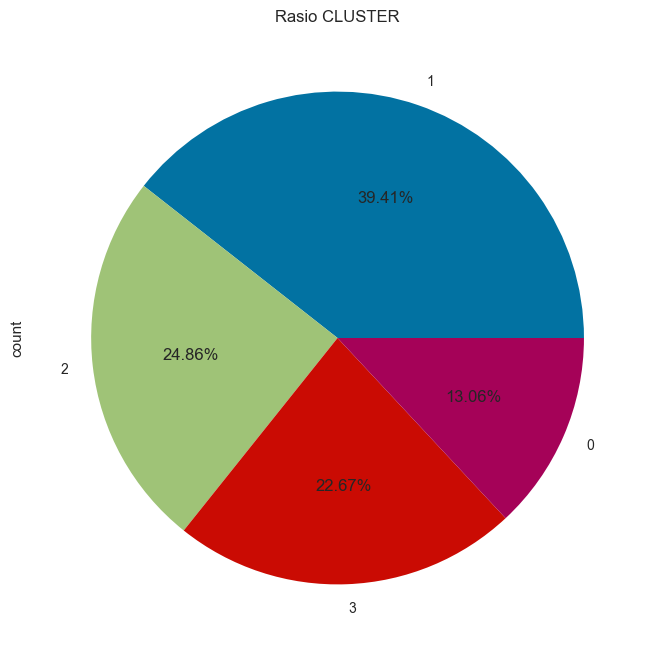

In [40]:
# Membuat Pie Chart
fig,ax1 = plt.subplots(figsize=(8,8))

df_cluster['cluster'].value_counts().plot(kind='pie', autopct='%.2f%%',ax=ax1)
plt.title('Rasio CLUSTER')
plt.show()

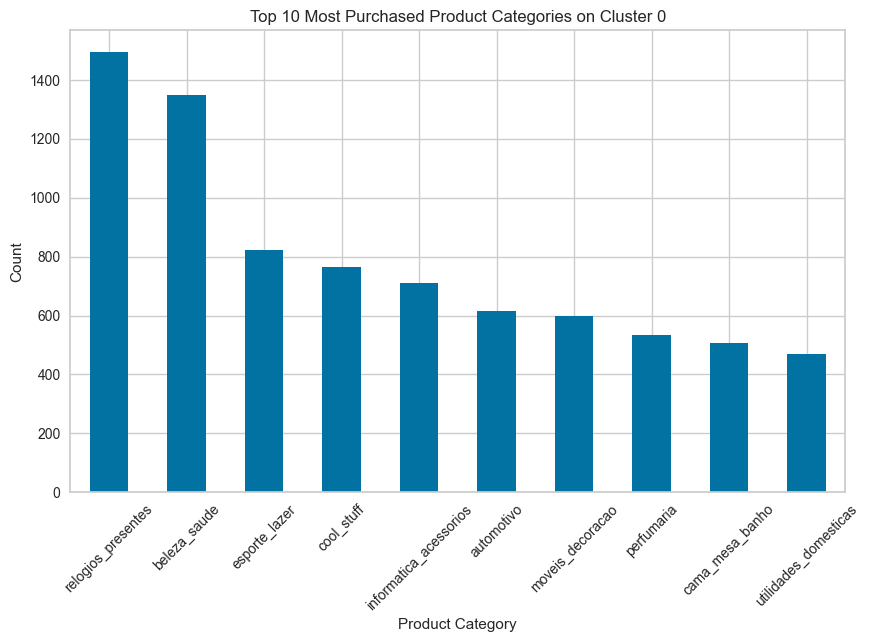

In [52]:
# Mengambil 10 kategori teratas
top_10_categories0 = cluster0['product_category_name'].value_counts().nlargest(10)

# Membuat diagram batang
fig, ax1 = plt.subplots(figsize=(10, 6))  # Ubah ukuran sesuai kebutuhan Anda
top_10_categories0.plot(kind='bar', ax=ax1)
plt.title('Top 10 Most Purchased Product Categories on Cluster 0')
plt.xlabel('Product Category')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Mengatur rotasi label sumbu x jika diperlukan
plt.show()

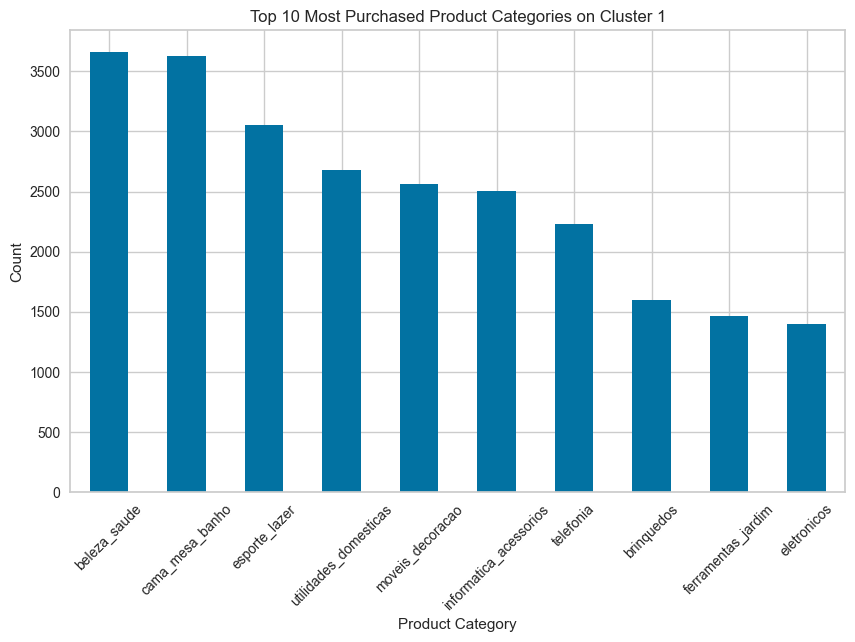

In [51]:
# Mengambil 10 kategori teratas
top_10_categories1 = cluster1['product_category_name'].value_counts().nlargest(10)

# Membuat diagram batang
fig, ax1 = plt.subplots(figsize=(10, 6))  # Ubah ukuran sesuai kebutuhan Anda
top_10_categories1.plot(kind='bar', ax=ax1)
plt.title('Top 10 Most Purchased Product Categories on Cluster 1')
plt.xlabel('Product Category')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Mengatur rotasi label sumbu x jika diperlukan
plt.show()

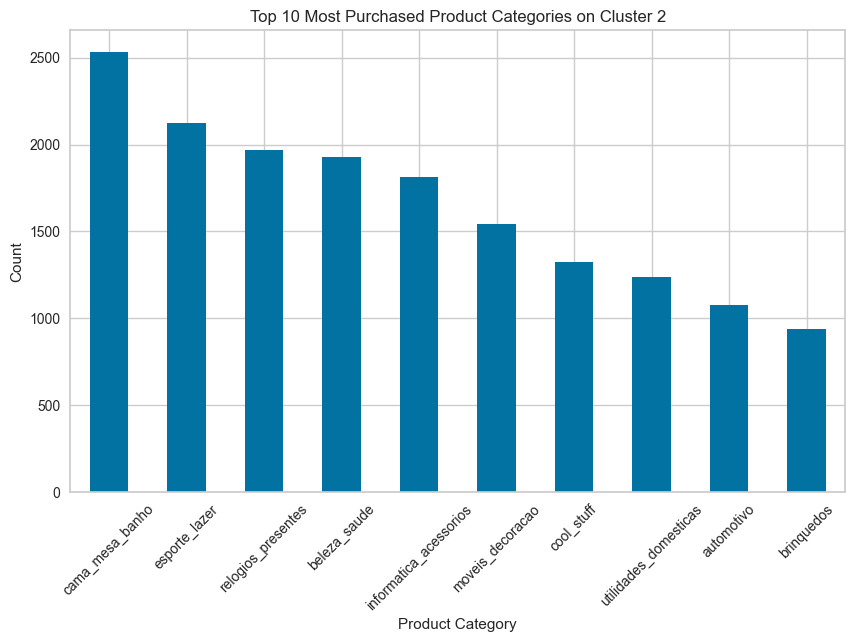

In [54]:
# Mengambil 10 kategori teratas
top_10_categories2 = cluster2['product_category_name'].value_counts().nlargest(10)

# Membuat diagram batang
fig, ax1 = plt.subplots(figsize=(10, 6))  # Ubah ukuran sesuai kebutuhan Anda
top_10_categories2.plot(kind='bar', ax=ax1)
plt.title('Top 10 Most Purchased Product Categories on Cluster 2')
plt.xlabel('Product Category')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Mengatur rotasi label sumbu x jika diperlukan
plt.show()

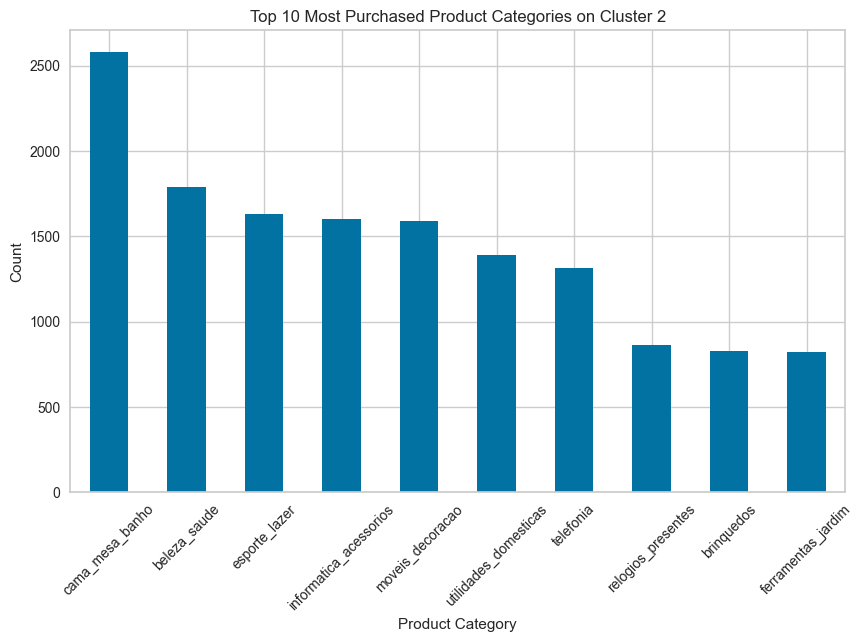

In [55]:
# Mengambil 10 kategori teratas
top_10_categories3 = cluster3['product_category_name'].value_counts().nlargest(10)

# Membuat diagram batang
fig, ax1 = plt.subplots(figsize=(10, 6))  # Ubah ukuran sesuai kebutuhan Anda
top_10_categories3.plot(kind='bar', ax=ax1)
plt.title('Top 10 Most Purchased Product Categories on Cluster 2')
plt.xlabel('Product Category')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Mengatur rotasi label sumbu x jika diperlukan
plt.show()